In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('Air_Quality.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16218 entries, 0 to 16217
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unique ID       16218 non-null  int64  
 1   Indicator ID    16218 non-null  int64  
 2   Name            16218 non-null  object 
 3   Measure         16218 non-null  object 
 4   Measure Info    16218 non-null  object 
 5   Geo Type Name   16218 non-null  object 
 6   Geo Join ID     16218 non-null  int64  
 7   Geo Place Name  16218 non-null  object 
 8   Time Period     16218 non-null  object 
 9   Start_Date      16218 non-null  object 
 10  Data Value      16218 non-null  float64
 11  Message         0 non-null      float64
dtypes: float64(2), int64(3), object(7)
memory usage: 1.5+ MB


In [4]:
df.head()
# United Hospital Fund neighborhoods
# Geo join ID - Identifier of the neighborhood geographic area, used for joining to mapping geography files 
# to make thematic maps

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Message
0,172653,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2011,12/01/2010,25.30,NaN
1,172585,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2009,12/01/2008,26.93,NaN
2,336637,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,204,East New York,Annual Average 2015,01/01/2015,19.09,NaN
3,336622,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,103,Fordham - Bronx Pk,Annual Average 2015,01/01/2015,19.76,NaN
4,172582,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,104,Pelham - Throgs Neck,Annual Average 2009,12/01/2008,22.83,NaN


In [5]:
!pip install geopy
from geopy.geocoders import Nominatim
import pandas as pd

# Create a geocoder object
geolocator = Nominatim(user_agent="my_geocoder")

# Your array of locations
locations = df['Geo Place Name'].unique()

# Empty lists to store latitude and longitude values
latitudes = []
longitudes = []

# Iterate over locations and geocode them
for location in locations:
    try:
        # Geocode the location
        location_info = geolocator.geocode(location)
        
        # If the location was successfully geocoded, append latitude and longitude to lists
        if location_info:
            latitudes.append(location_info.latitude)
            longitudes.append(location_info.longitude)
        else:
            latitudes.append(None)
            longitudes.append(None)
    except Exception as e:
        print(f"Error geocoding {location}: {str(e)}")
        latitudes.append(None)
        longitudes.append(None)

# Create a DataFrame to store the geocoded data
geocoded_data = pd.DataFrame({'Location': locations, 'Latitude': latitudes, 'Longitude': longitudes})


In [6]:
df2 = pd.merge(df,geocoded_data,left_on = 'Geo Place Name',right_on = 'Location',how = 'left')

In [7]:
df2 = df2.drop('Message', axis=1)
df2

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Location,Latitude,Longitude
0,172653,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2011,12/01/2010,25.30,Bedford Stuyvesant - Crown Heights,NaN,NaN
1,172585,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2009,12/01/2008,26.93,Bedford Stuyvesant - Crown Heights,NaN,NaN
2,336637,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,204,East New York,Annual Average 2015,01/01/2015,19.09,East New York,40.666770,-73.882358
3,336622,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,103,Fordham - Bronx Pk,Annual Average 2015,01/01/2015,19.76,Fordham - Bronx Pk,40.853849,-73.877722
4,172582,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,104,Pelham - Throgs Neck,Annual Average 2009,12/01/2008,22.83,Pelham - Throgs Neck,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16213,130750,647,Outdoor Air Toxics - Formaldehyde,Annual average concentration,µg/m3,UHF42,211,Williamsburg - Bushwick,2005,01/01/2005,3.10,Williamsburg - Bushwick,40.711182,-73.947443
16214,130780,647,Outdoor Air Toxics - Formaldehyde,Annual average concentration,µg/m3,Borough,5,Staten Island,2005,01/01/2005,2.30,Staten Island,40.583456,-74.149605
16215,131020,652,Cardiac and respiratory deaths due to Ozone,Estimated annual rate,"per 100,000",UHF42,504,South Beach - Tottenville,2005-2007,01/01/2005,7.50,South Beach - Tottenville,NaN,NaN
16216,131026,652,Cardiac and respiratory deaths due to Ozone,Estimated annual rate,"per 100,000",Borough,5,Staten Island,2005-2007,01/01/2005,7.80,Staten Island,40.583456,-74.149605


In [8]:
df3 = df2[df2['Latitude'].isna()==False]

In [9]:
df3

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Location,Latitude,Longitude
2,336637,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,204,East New York,Annual Average 2015,01/01/2015,19.09,East New York,40.666770,-73.882358
3,336622,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,103,Fordham - Bronx Pk,Annual Average 2015,01/01/2015,19.76,Fordham - Bronx Pk,40.853849,-73.877722
6,172607,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,306308,Chelsea-Village,Annual Average 2009,12/01/2008,38.16,Chelsea-Village,-26.063565,27.956111
7,172675,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,306308,Chelsea-Village,Annual Average 2011,12/01/2010,34.96,Chelsea-Village,-26.063565,27.956111
8,175345,375,Nitrogen dioxide (NO2),Mean,ppb,UHF42,206,Borough Park,Winter 2010-11,12/01/2010,30.10,Borough Park,40.633993,-73.996806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16212,130834,648,Asthma emergency department visits due to PM2.5,Estimated annual rate (under age 18),"per 100,000 children",Borough,5,Staten Island,2005-2007,01/01/2005,55.30,Staten Island,40.583456,-74.149605
16213,130750,647,Outdoor Air Toxics - Formaldehyde,Annual average concentration,µg/m3,UHF42,211,Williamsburg - Bushwick,2005,01/01/2005,3.10,Williamsburg - Bushwick,40.711182,-73.947443
16214,130780,647,Outdoor Air Toxics - Formaldehyde,Annual average concentration,µg/m3,Borough,5,Staten Island,2005,01/01/2005,2.30,Staten Island,40.583456,-74.149605
16216,131026,652,Cardiac and respiratory deaths due to Ozone,Estimated annual rate,"per 100,000",Borough,5,Staten Island,2005-2007,01/01/2005,7.80,Staten Island,40.583456,-74.149605


In [55]:
df5 = (df2[(df2['Time Period'].str.contains('2012')) | (df2['Time Period'].str.contains('2013'))])

In [65]:
import folium
import pandas as pd

# Group the data by the "Name" column
grouped_data = df3.groupby("Name")

# Iterate over each group and create a map for each one
for name, group in grouped_data:
    # Create a map centered around the first location of the group
    map_name = folium.Map(location=[group['Latitude'].iloc[0], group['Longitude'].iloc[0]], zoom_start=10)
    
    # Add markers for each location in the group
    for index, row in group.iterrows():
        folium.Marker(location=[row['Latitude'], row['Longitude']], popup=row['Data Value']).add_to(map_name)
    
    # Save the map to a separate HTML file for each unique Name
    map_name.save(f'{name}_map.html')


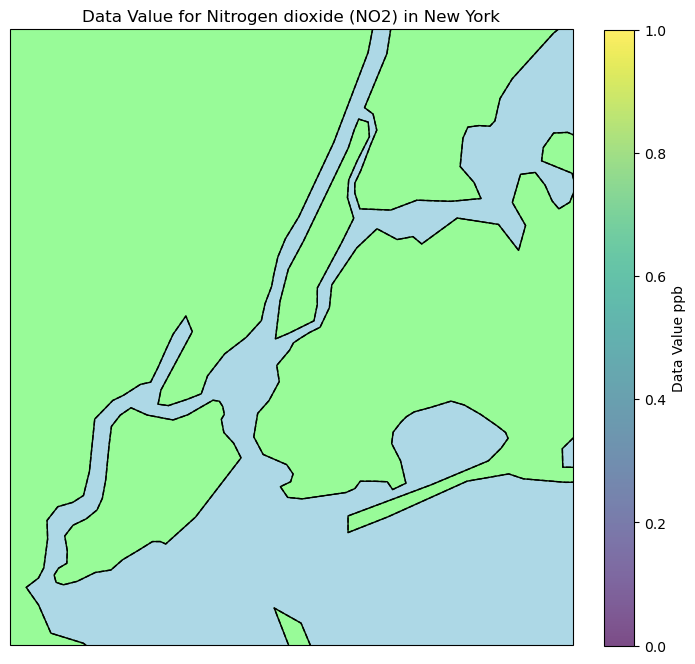

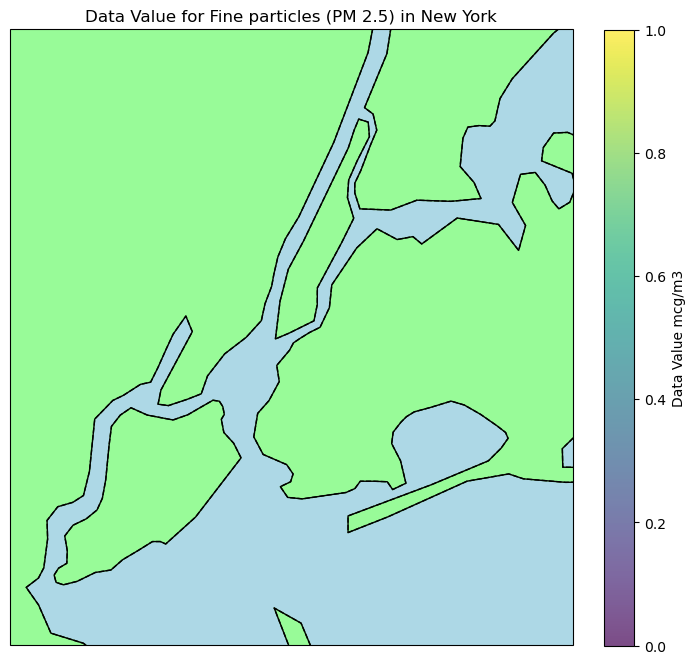

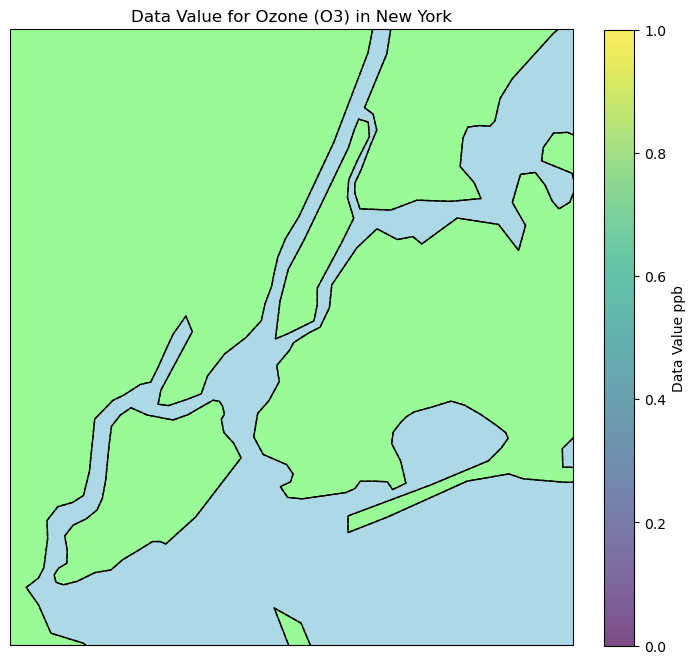

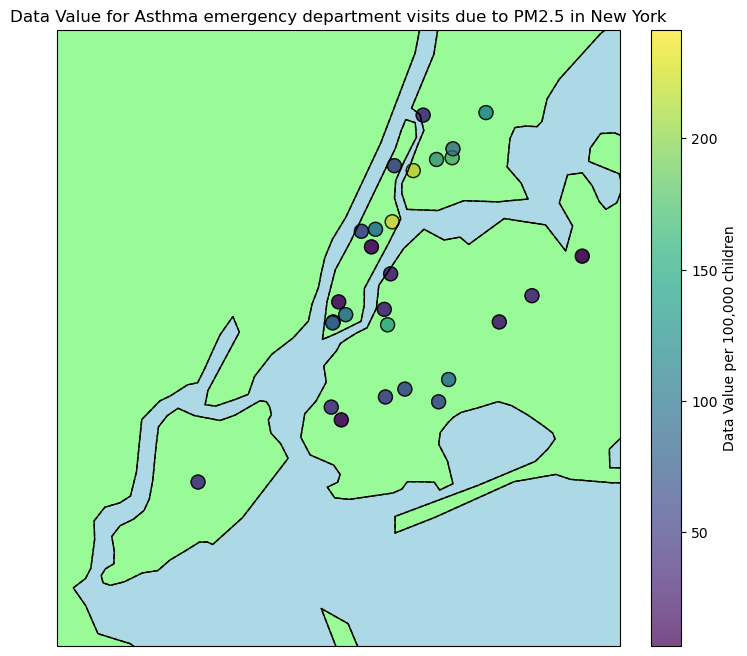

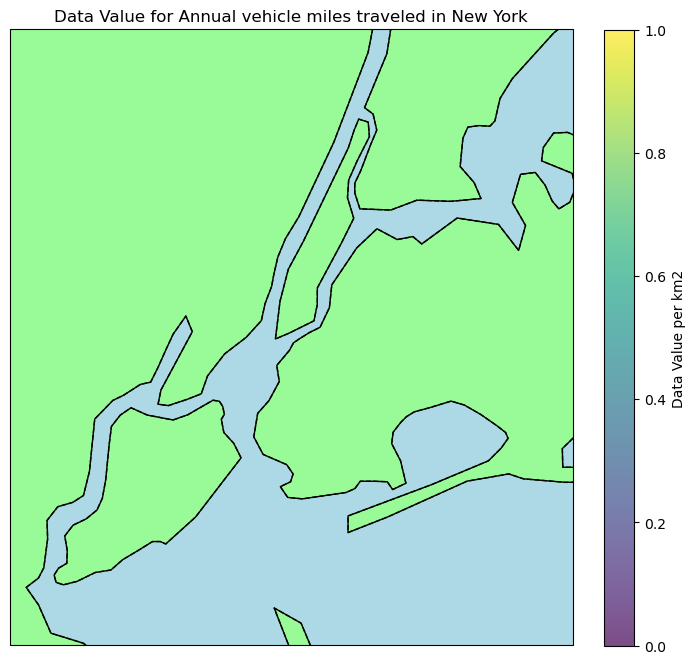

...

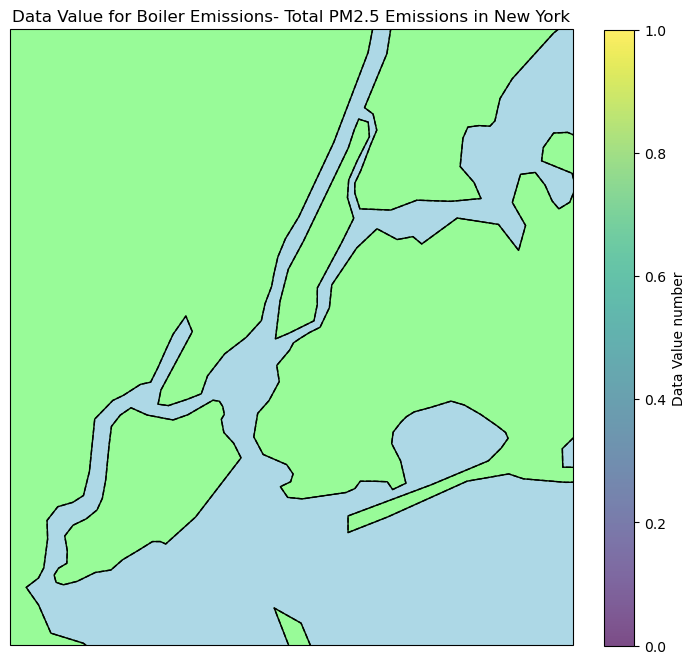

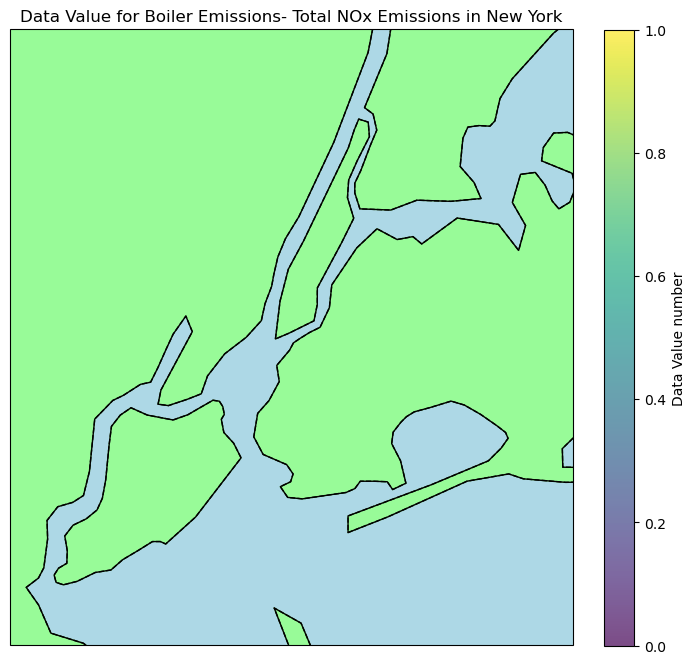

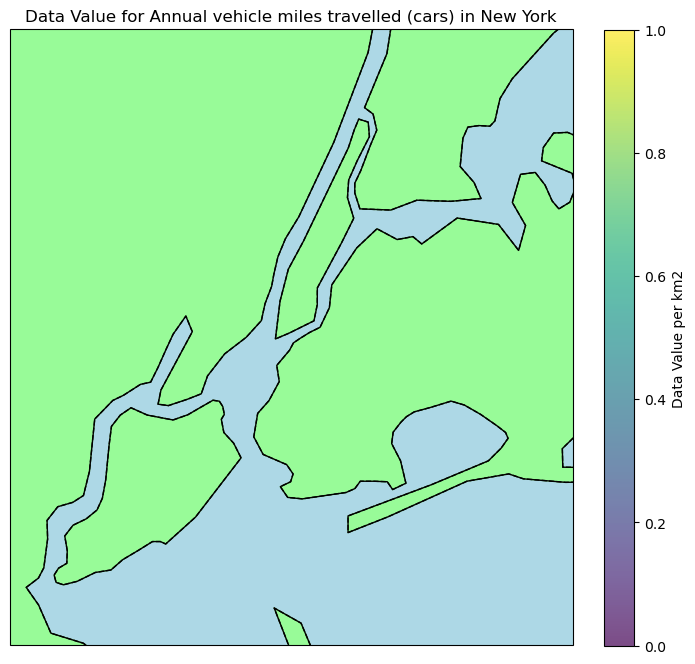

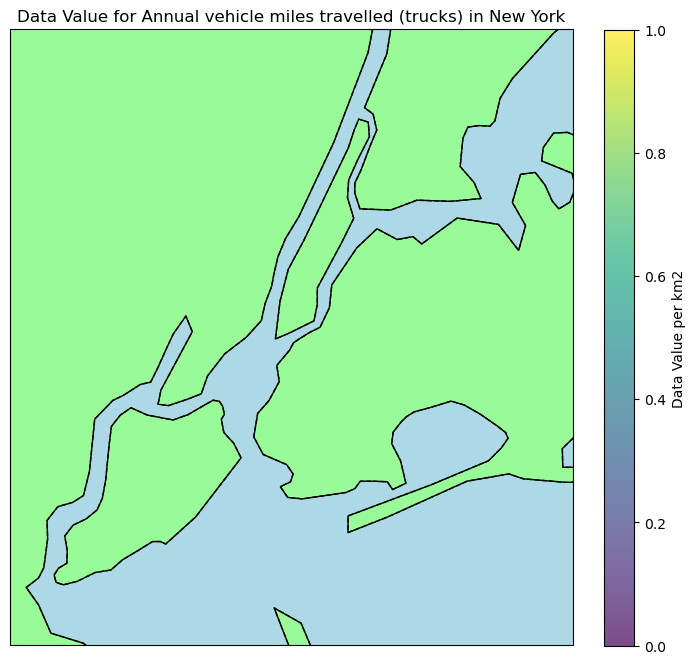

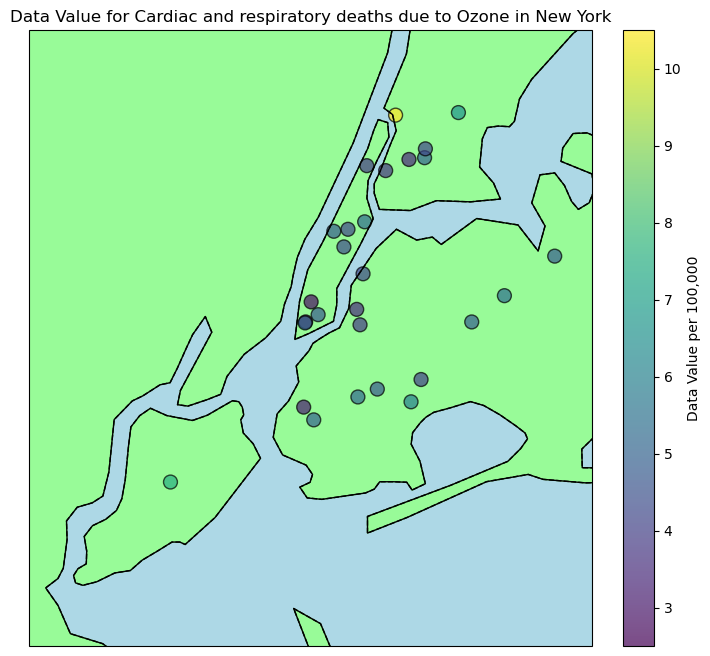

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Filter data for the time period
df4 = df3[df3['Time Period'] == '2012-2014']

# Iterate through unique_names
for name in unique_names:
    # Create a new figure and axis for each map
    fig = plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=ccrs.Mercator())
    unit = df[df['Name'] == name]['Measure Info'].unique()
    # Add satellite imagery as the background
    ax.add_feature(cfeature.OCEAN, color='lightblue')  # Customize ocean color
    ax.add_feature(cfeature.LAND, color='palegreen')    # Customize land color
    ax.add_feature(cfeature.COASTLINE, edgecolor='black')
    ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black')
    ax.add_feature(cfeature.STATES, linestyle='--', edgecolor='black')

    # Set the extent to New York
    ax.set_extent([-74.3, -73.7, 40.45, 40.95], crs=ccrs.PlateCarree())

    # Filter data for current name and time period
    subset = df4[df4['Name'] == name]
    
    # Plot data points
    sc = ax.scatter(subset['Longitude'].values, subset['Latitude'].values, c=subset['Data Value'], cmap='viridis', s=100, alpha=0.7, edgecolors='k', linewidths=1, transform=ccrs.PlateCarree())

    # Add title
    plt.title(f'Data Value for {name} in New York')
    
    # Add colorbar
    cbar = plt.colorbar(sc, orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label(f'Data Value {unit[0]}')

    # Show the map
    plt.show()


In [34]:
unique_names


array(['Nitrogen dioxide (NO2)', 'Fine particles (PM 2.5)', 'Ozone (O3)',
       'Asthma emergency department visits due to PM2.5',
       'Annual vehicle miles traveled',
       'Respiratory hospitalizations due to PM2.5 (age 20+)',
       'Boiler Emissions- Total SO2 Emissions',
       'Asthma hospitalizations due to Ozone',
       'Cardiovascular hospitalizations due to PM2.5 (age 40+)',
       'Boiler Emissions- Total PM2.5 Emissions',
       'Boiler Emissions- Total NOx Emissions',
       'Annual vehicle miles travelled (cars)',
       'Annual vehicle miles travelled (trucks)',
       'Cardiac and respiratory deaths due to Ozone',
       'Asthma emergency departments visits due to Ozone',
       'Outdoor Air Toxics - Formaldehyde',
       'Outdoor Air Toxics - Benzene', 'Deaths due to PM2.5'],
      dtype=object)

In [115]:
df['Time Period'].unique()

array(['Annual Average 2011', 'Annual Average 2009',
       'Annual Average 2015', 'Annual Average 2020', 'Winter 2010-11',
       'Annual Average 2013', 'Winter 2014-15', 'Annual Average 2021',
       'Summer 2009', 'Annual Average 2017', 'Winter 2009-10',
       'Summer 2017', 'Summer 2018', 'Winter 2018-19', 'Summer 2014',
       'Winter 2016-17', 'Annual Average 2014', 'Winter 2011-12',
       'Summer 2020', '2-Year Summer Average 2009-2010',
       'Annual Average 2016', 'Annual Average 2018', 'Summer 2013',
       'Summer 2021', 'Summer 2012', 'Winter 2008-09', 'Winter 2017-18',
       'Winter 2013-14', 'Annual Average 2019', 'Summer 2016',
       'Summer 2010', 'Winter 2020-21', 'Summer 2011', 'Winter 2015-16',
       'Summer 2015', 'Summer 2019', 'Winter 2019-20', '2012-2014',
       '2015-2017', 'Annual Average 2010', 'Winter 2012-13', '2009-2011',
       '2016', '2005', '2005-2007', 'Annual Average 2012', '2015', '2013',
       '2011', '2014'], dtype=object)

In [64]:
df6=df2[df2['Location']=='Bedford Stuyvesant - Crown Heights']

In [68]:
(df6['Time Period'].describe())

count           242
unique           50
top       2005-2007
freq             10
Name: Time Period, dtype: object

In [79]:
df6[df6['Name']=='Nitrogen dioxide (NO2)']['Time Period'].describe()

count                      78
unique                     39
top       Annual Average 2011
freq                        2
Name: Time Period, dtype: object

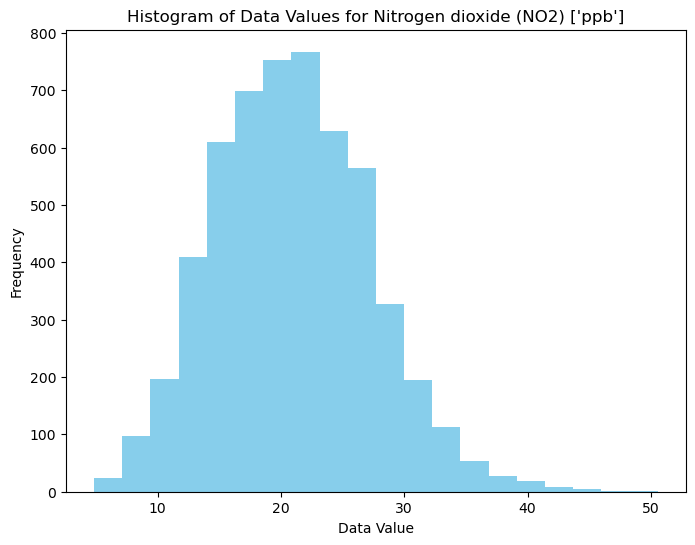

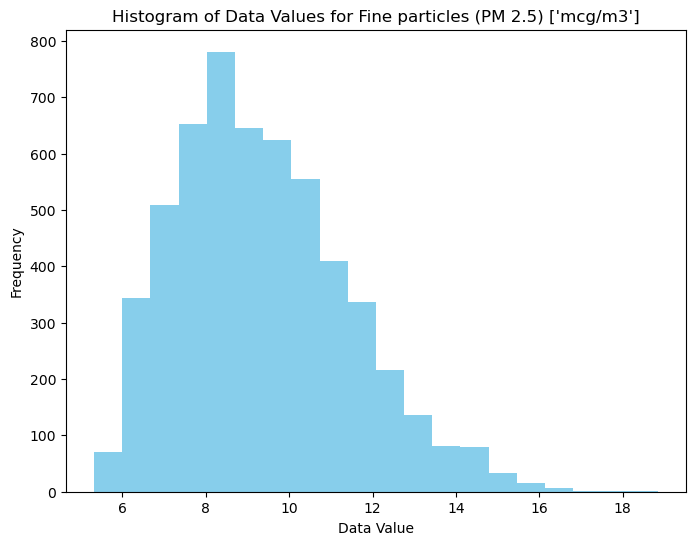

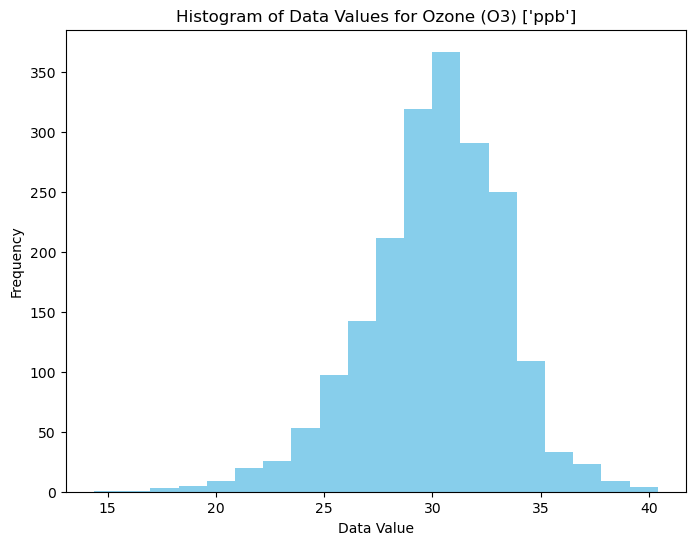

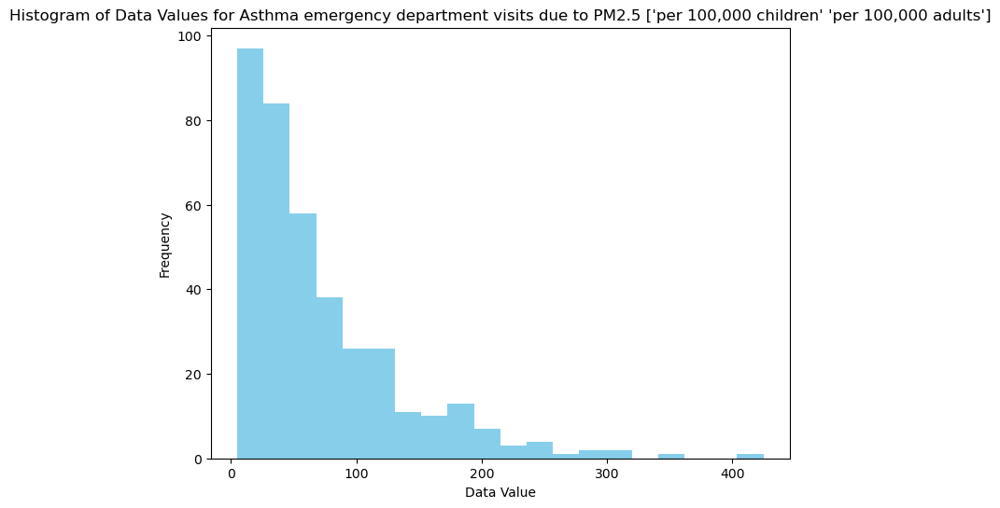

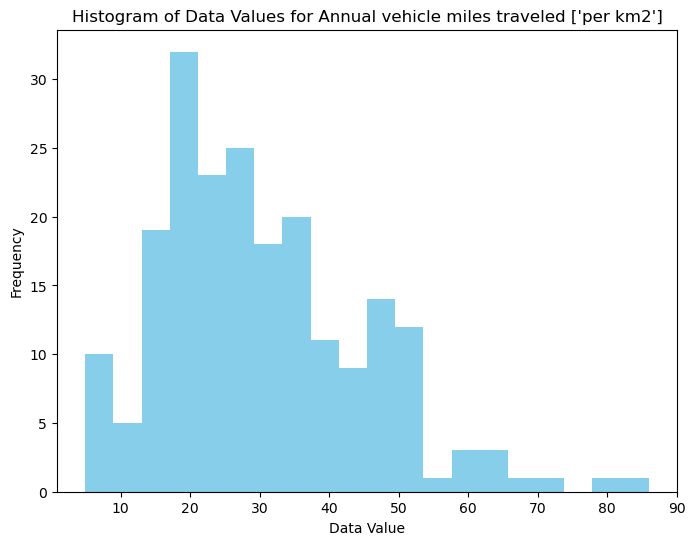

...

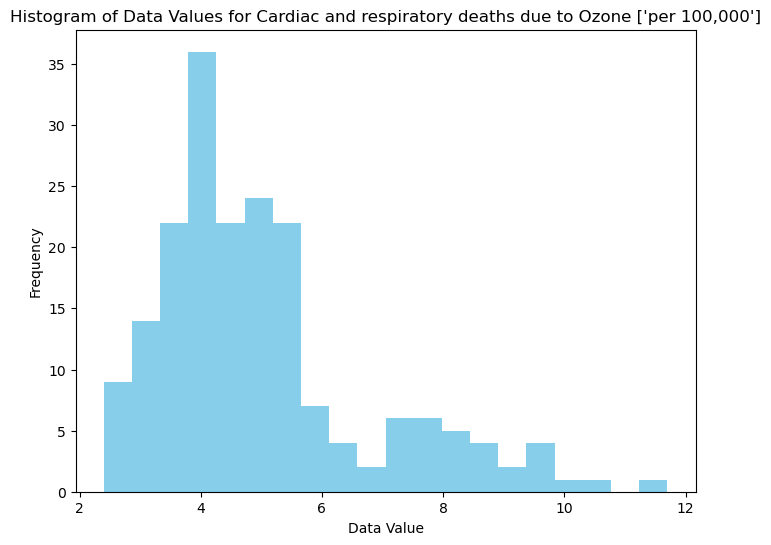

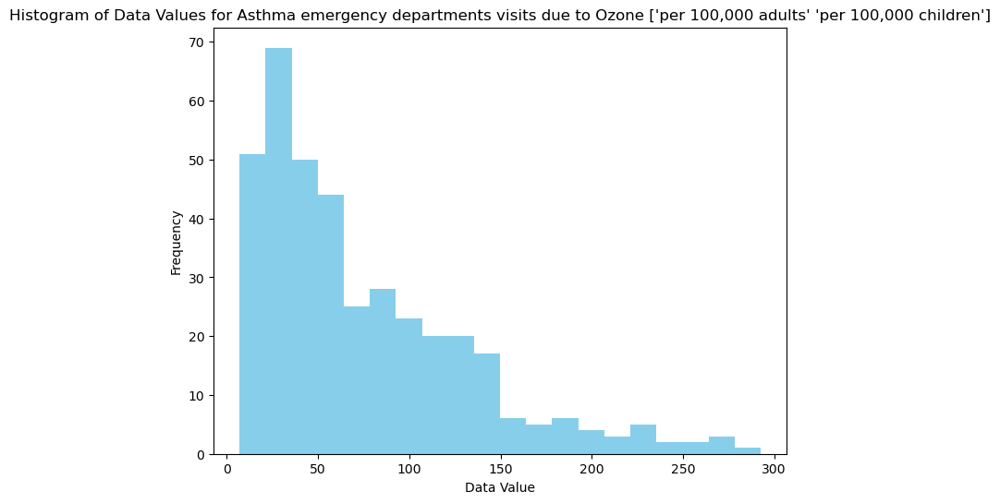

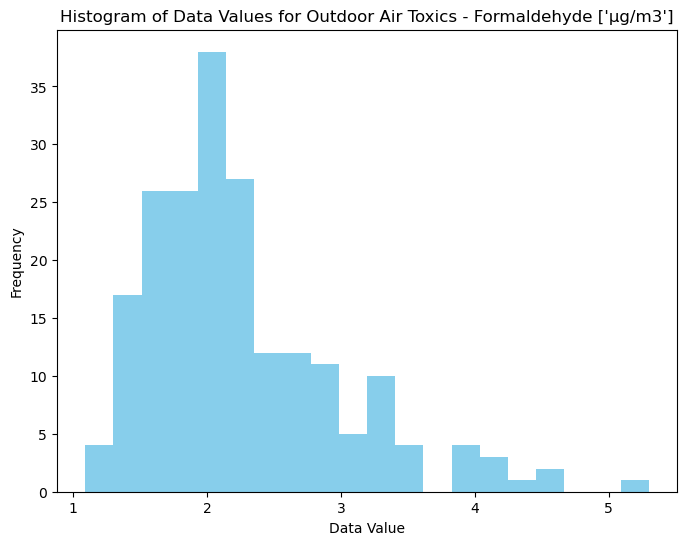

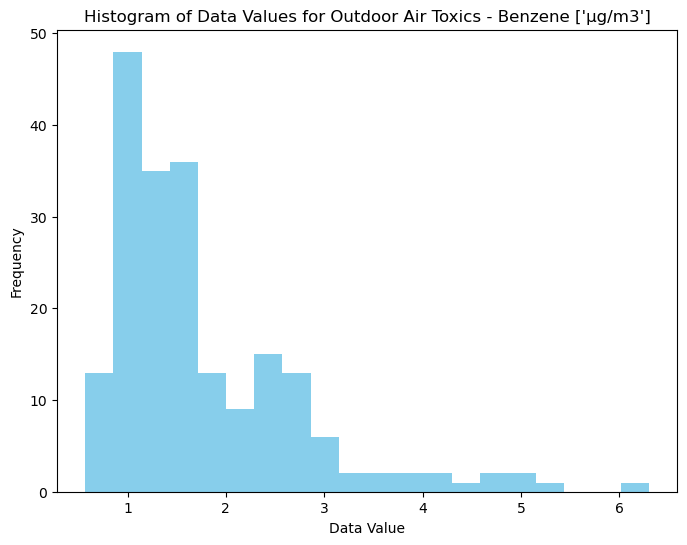

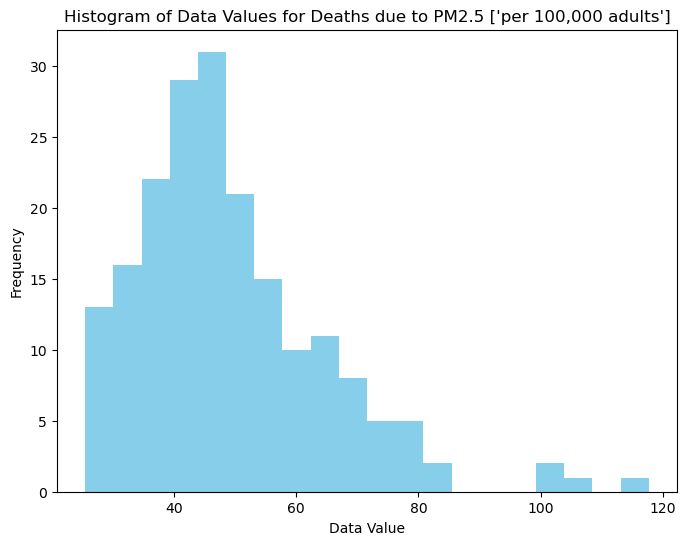

In [134]:
import matplotlib.pyplot as plt

# Get unique names
unique_names = df['Name'].unique()

# Create a separate histogram for each group (name)
for name in unique_names:
    # Filter data for the current name
    data_for_name = df[df['Name'] == name]['Data Value']
    unit = df[df['Name'] == name]['Measure Info'].unique()
    # Create a histogram
    plt.figure(figsize=(8, 6))
    plt.hist(data_for_name, bins=20, color='skyblue')
    plt.xlabel('Data Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Data Values for {name} {unit}')
    plt.show()


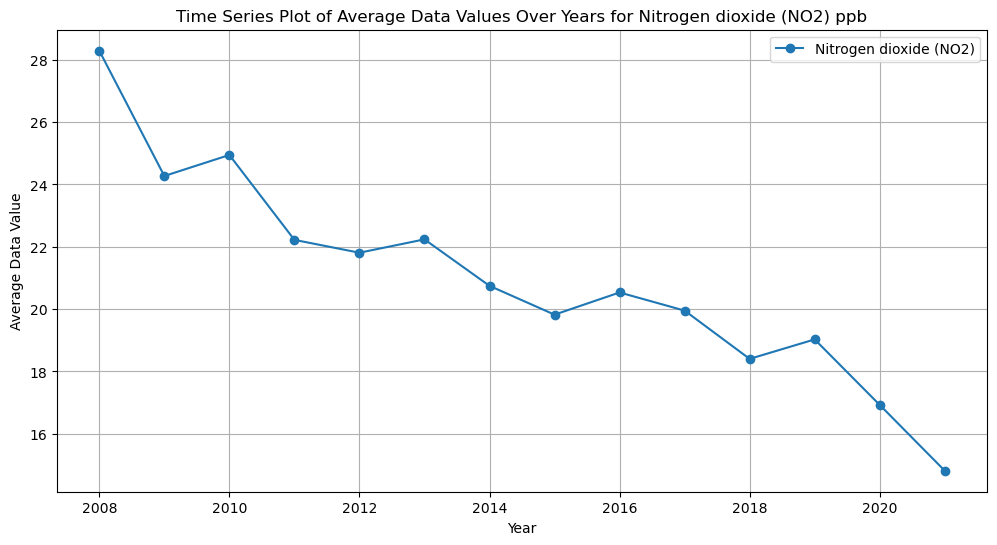

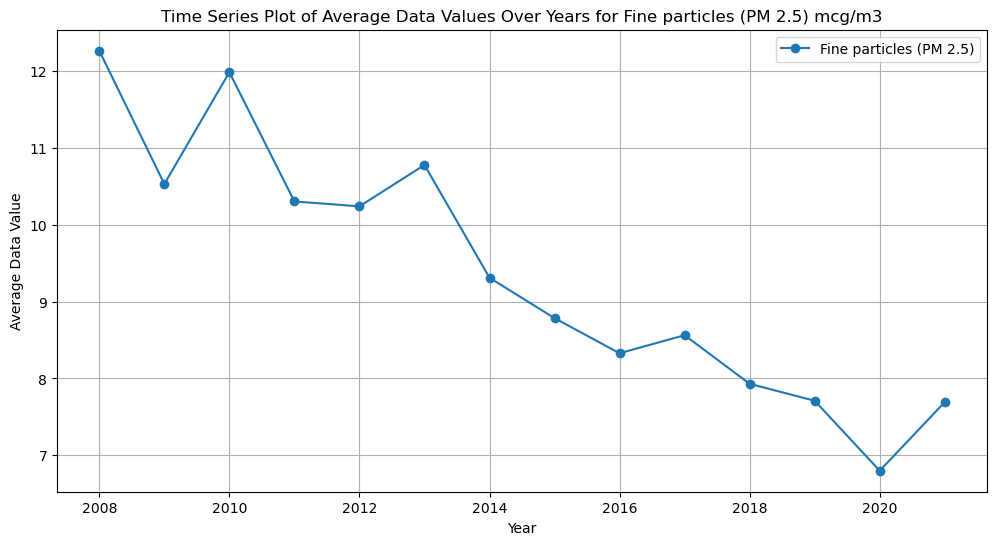

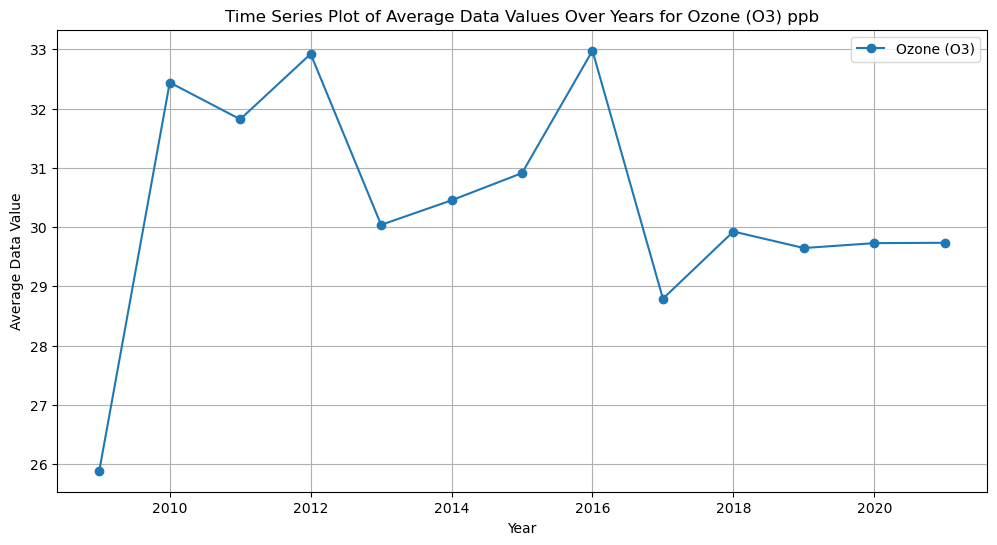

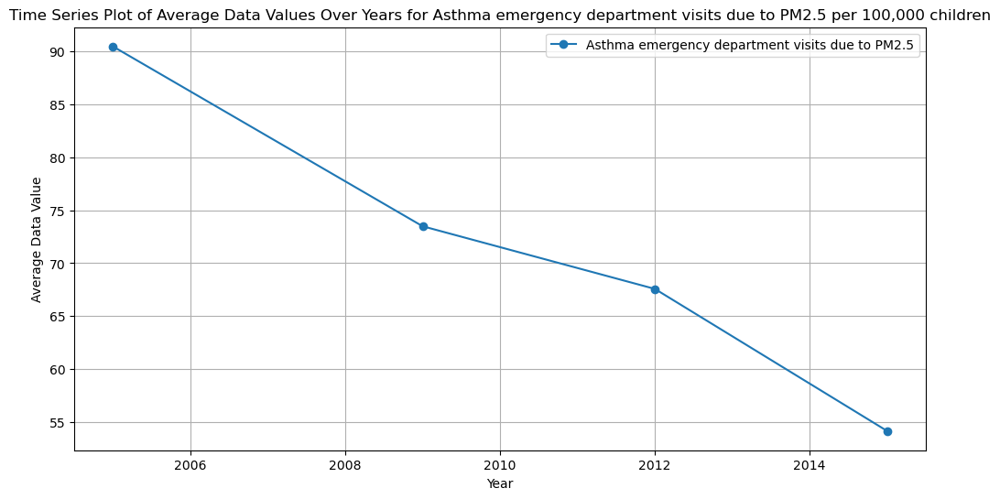

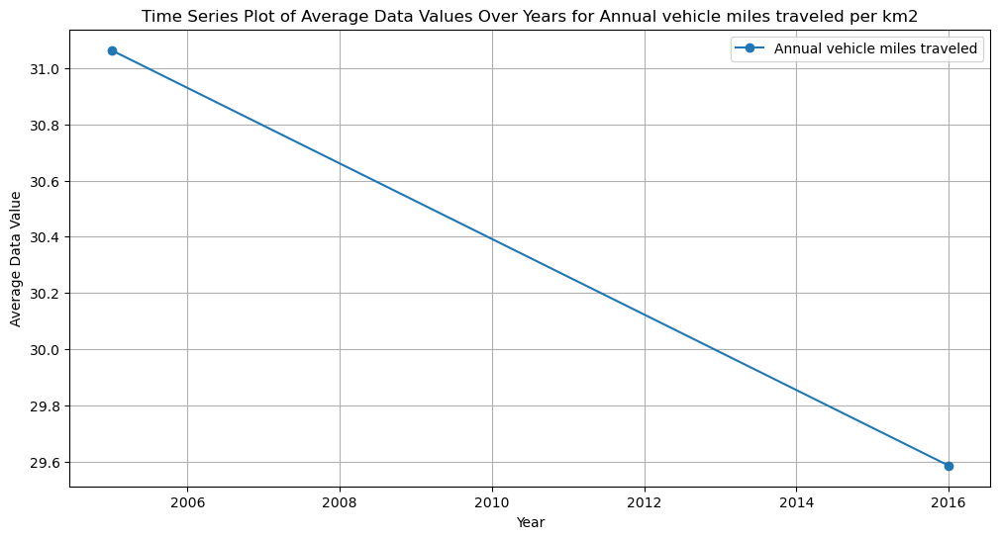

...

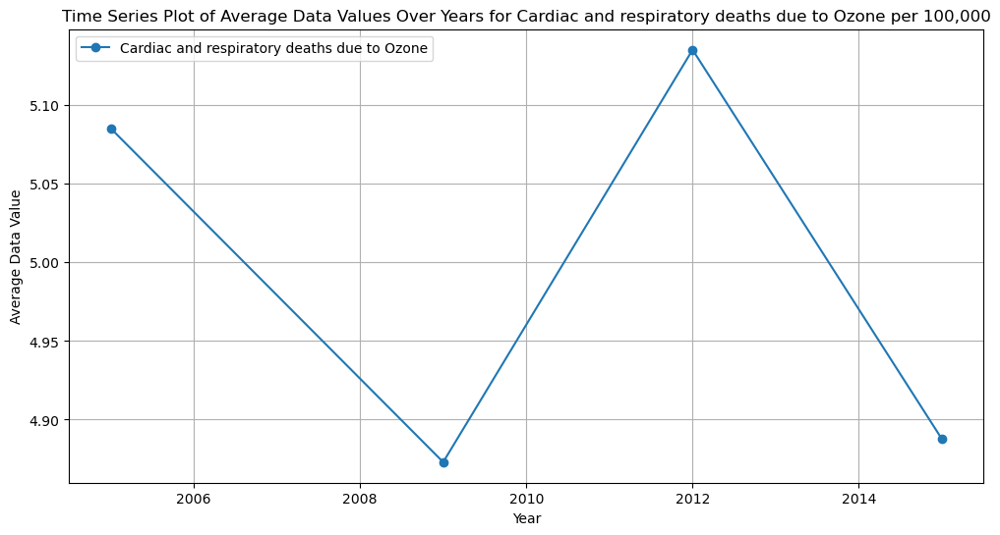

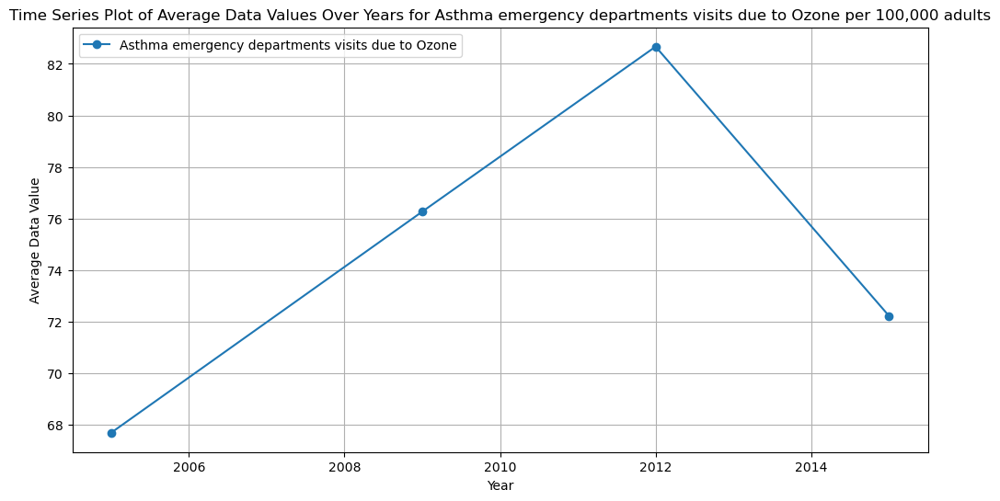

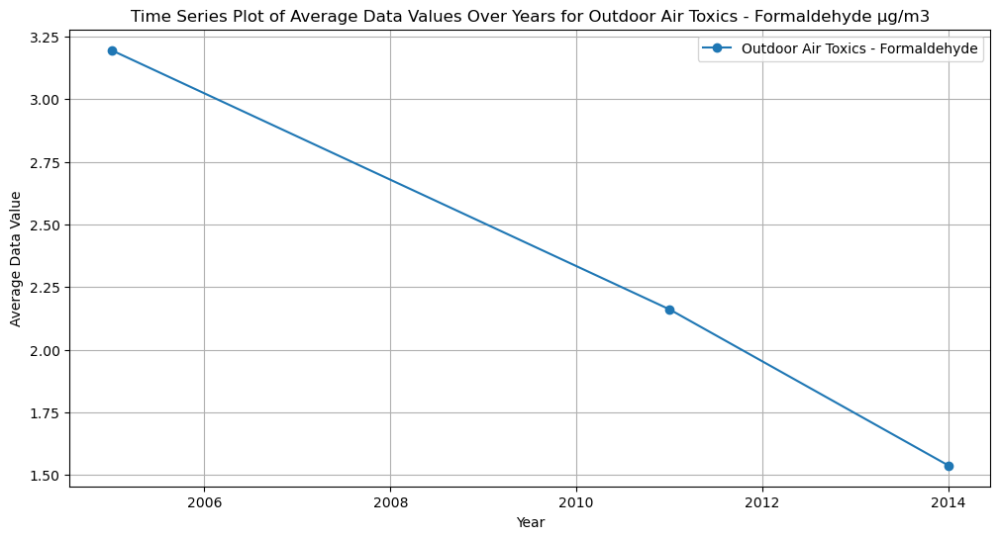

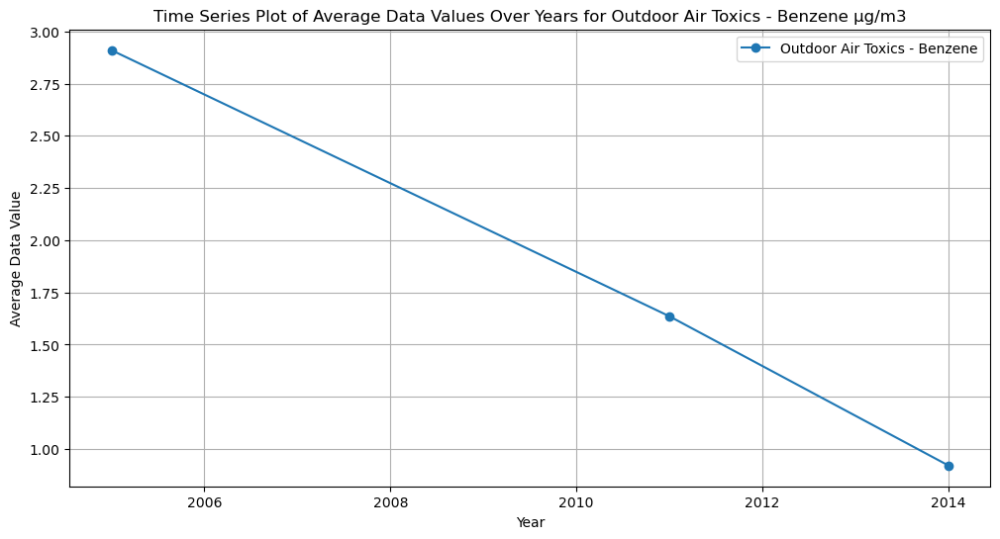

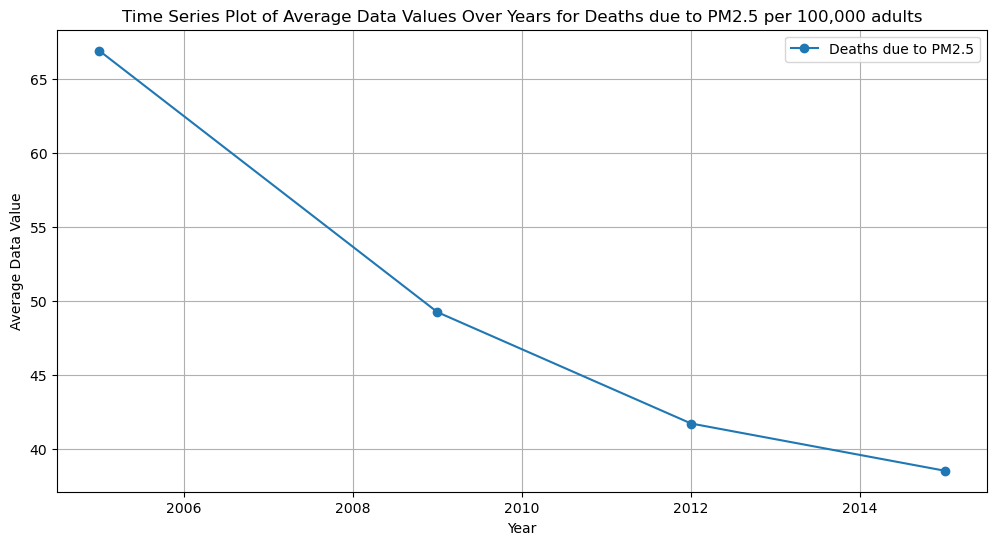

In [110]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert 'Start_Date' to datetime
df['Start_Date'] = pd.to_datetime(df['Start_Date'])

# Extract year from 'Start_Date'
df['Year'] = df['Start_Date'].dt.year

# Get unique names
unique_names = df['Name'].unique()

# Iterate over each unique name
for name in unique_names:
    # Filter data for the current name
    data_for_name = df[df['Name'] == name]
    unit = df[df['Name'] == name]['Measure Info'].unique()
    
    # Group data by year and calculate the mean value for each year
    average_by_year = data_for_name.groupby('Year')['Data Value'].mean()
    
    # Create a time series plot for average values
    plt.figure(figsize=(12, 6))
    plt.plot(average_by_year.index, average_by_year.values, marker='o', linestyle='-', label=name)
    plt.xlabel('Year')
    plt.ylabel('Average Data Value')
    plt.title(f'Time Series Plot of Average Data Values Over Years for {name} {unit[0]}')
    plt.grid(True)
    plt.legend()
    plt.show()


In [100]:
df.head()

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Message
0,172653,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2011,12/01/2010,25.30,NaN
1,172585,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,203,Bedford Stuyvesant - Crown Heights,Annual Average 2009,12/01/2008,26.93,NaN
2,336637,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,204,East New York,Annual Average 2015,01/01/2015,19.09,NaN
3,336622,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,103,Fordham - Bronx Pk,Annual Average 2015,01/01/2015,19.76,NaN
4,172582,375,Nitrogen dioxide (NO2),Mean,ppb,UHF34,104,Pelham - Throgs Neck,Annual Average 2009,12/01/2008,22.83,NaN


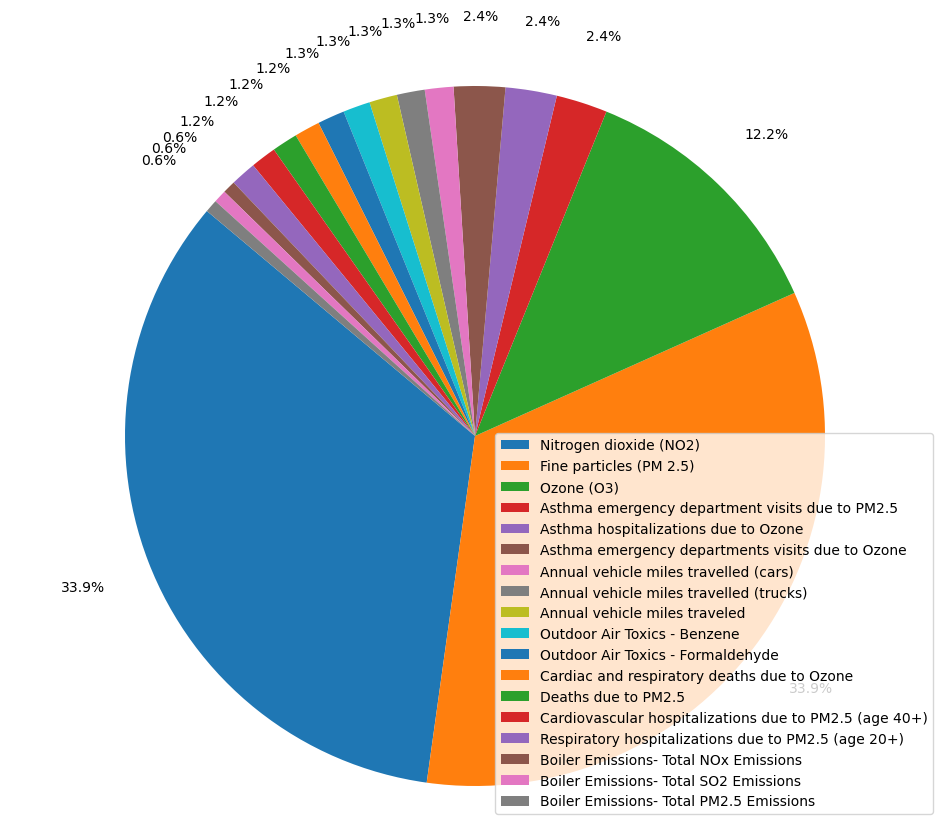

In [111]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the count of entries per name
name_counts = df['Name'].value_counts()

# Calculate the percentage of entries per name
total_entries = len(df)
name_percentages = (name_counts / total_entries) * 100

# Create the pie chart with pandas
plt.figure(figsize=(12, 10))  # Increase the figure size
name_percentages.plot(kind='pie', autopct='%1.1f%%', startangle=140, labels=None, pctdistance=1.2)
plt.ylabel('')  # Remove the ylabel
plt.legend(name_percentages.index, loc="best")  # Add a legend instead of labels
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()


In [118]:
# Assuming 'Name', 'Data Value', 'Geo Place Name', and 'Start_Date' are columns in your cleaned DataFrame

# Step 1: Filter for NO2 and O3 observations
no2_data = df2[df2['Name'] == 'Nitrogen dioxide (NO2)'][['Geo Place Name', 'Start_Date', 'Data Value']].rename(columns={'Data Value': 'NO2 Level'})
o3_data = df2[df2['Name'] == 'Ozone (O3)'][['Geo Place Name', 'Start_Date', 'Data Value']].rename(columns={'Data Value': 'O3 Level'})

# Step 2: Merge on 'Geo Place Name' and 'Start_Date' to align observations
comparison_data = pd.merge(no2_data, o3_data, on=['Geo Place Name', 'Start_Date'], how='inner')

# Now `comparison_data` contains aligned NO2 and O3 levels for the same locations and dates


/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


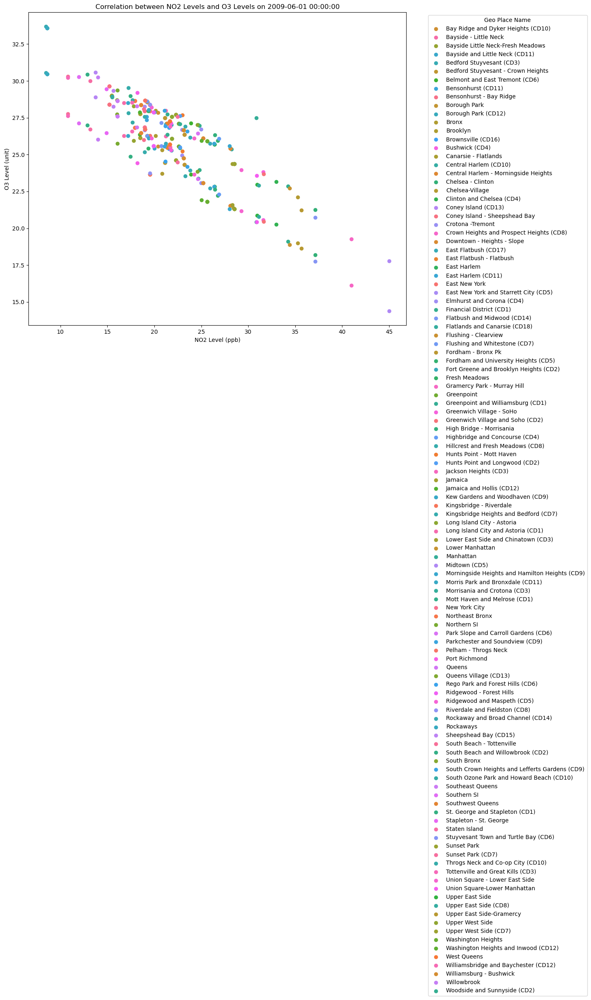

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


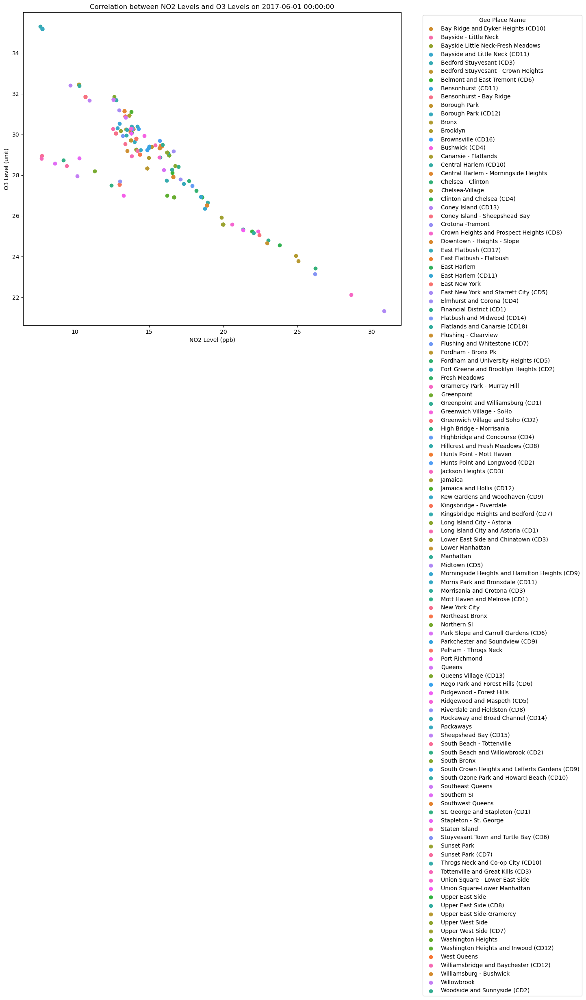

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


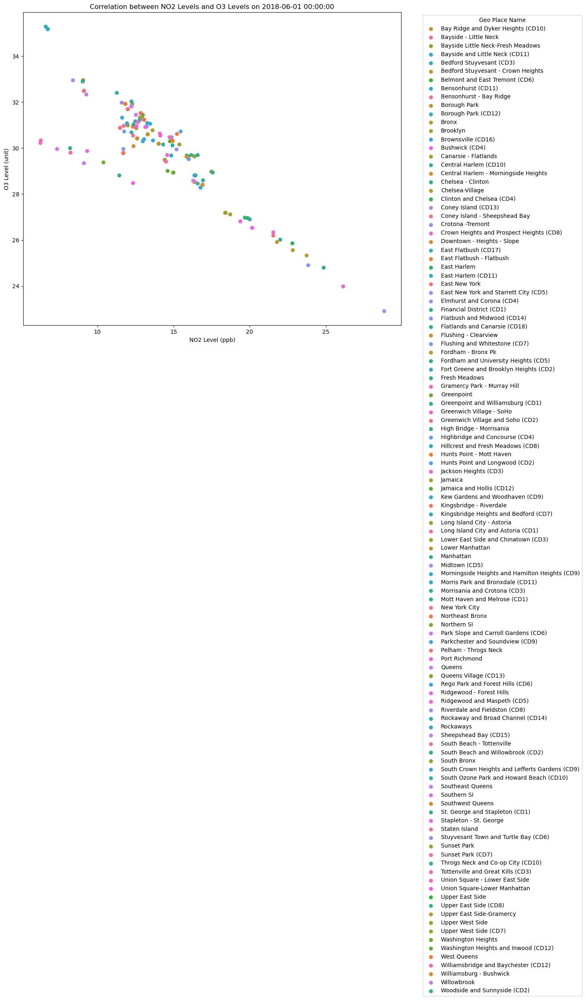

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


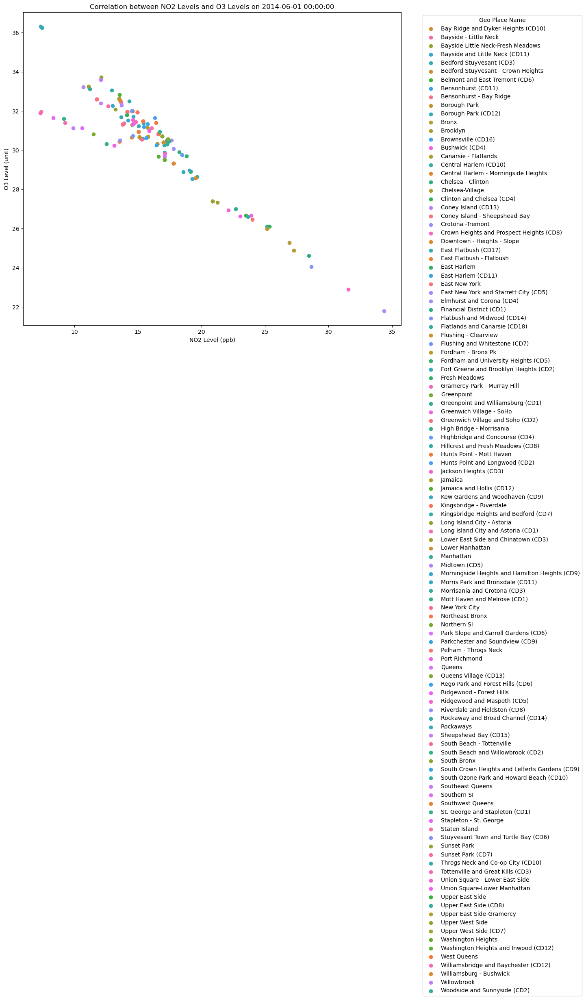

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


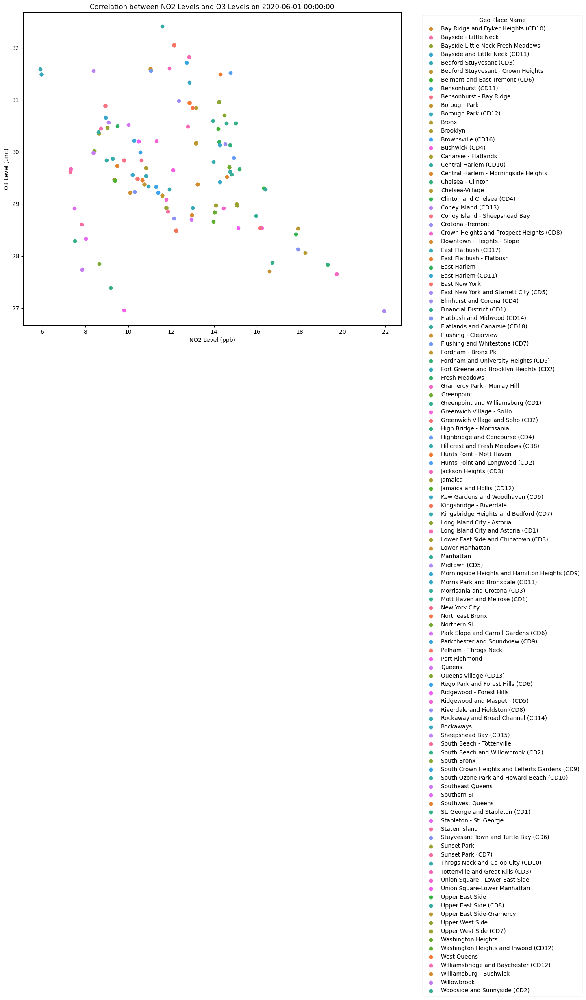

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


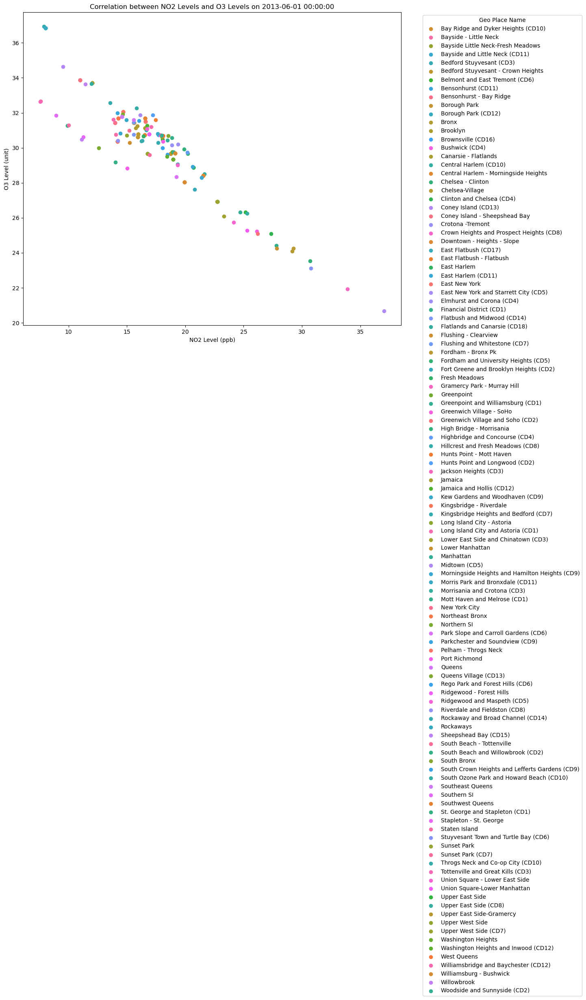

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


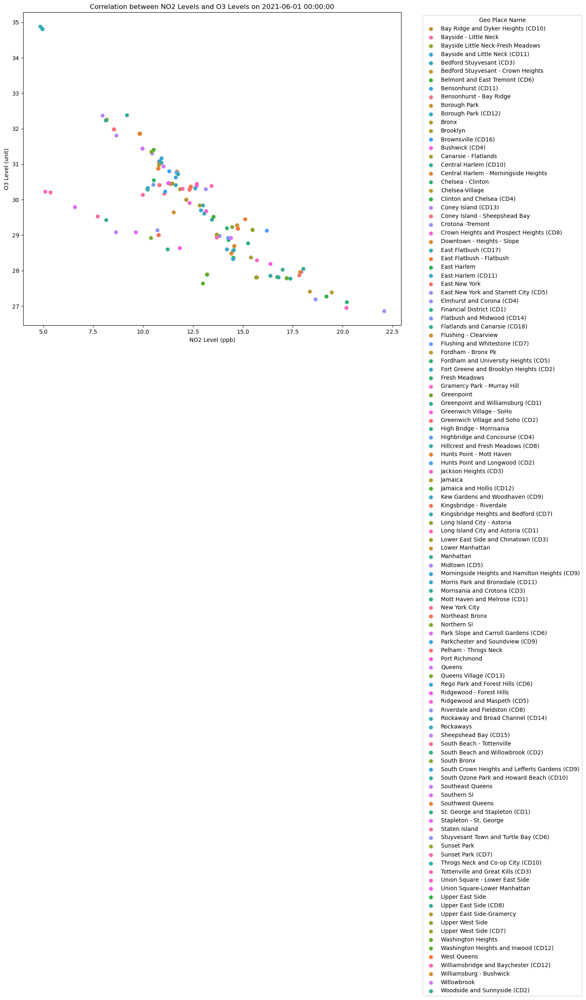

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


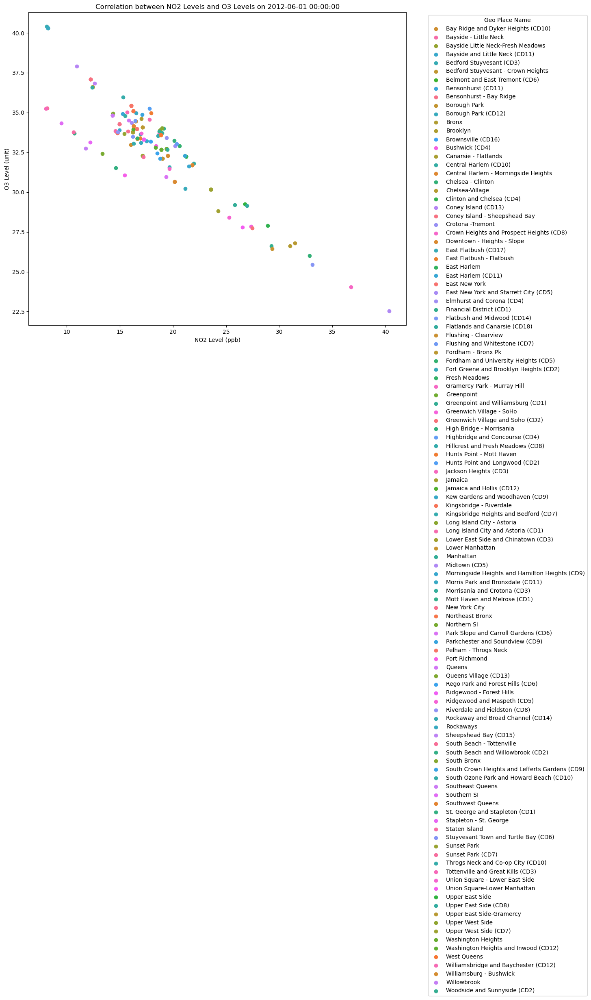

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


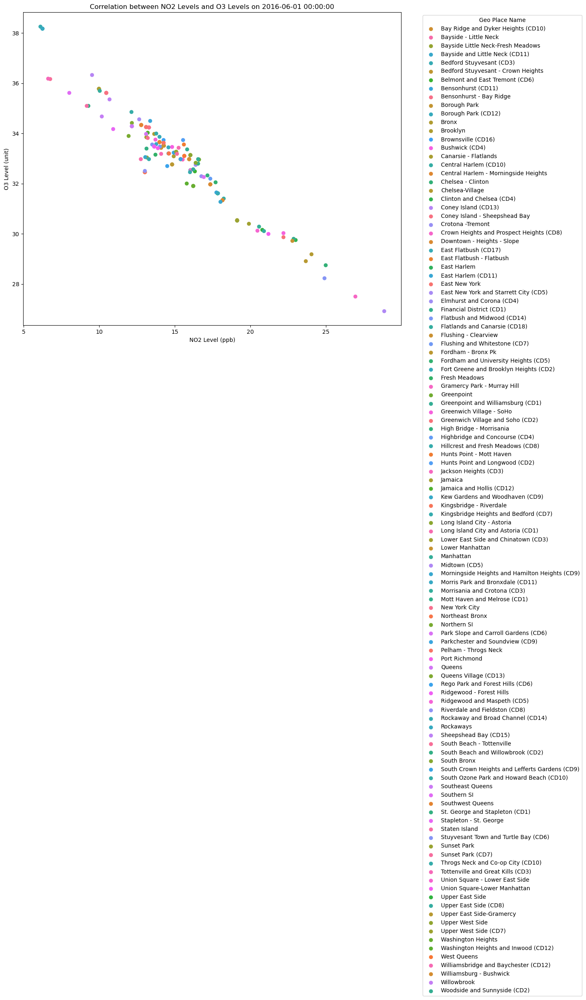

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


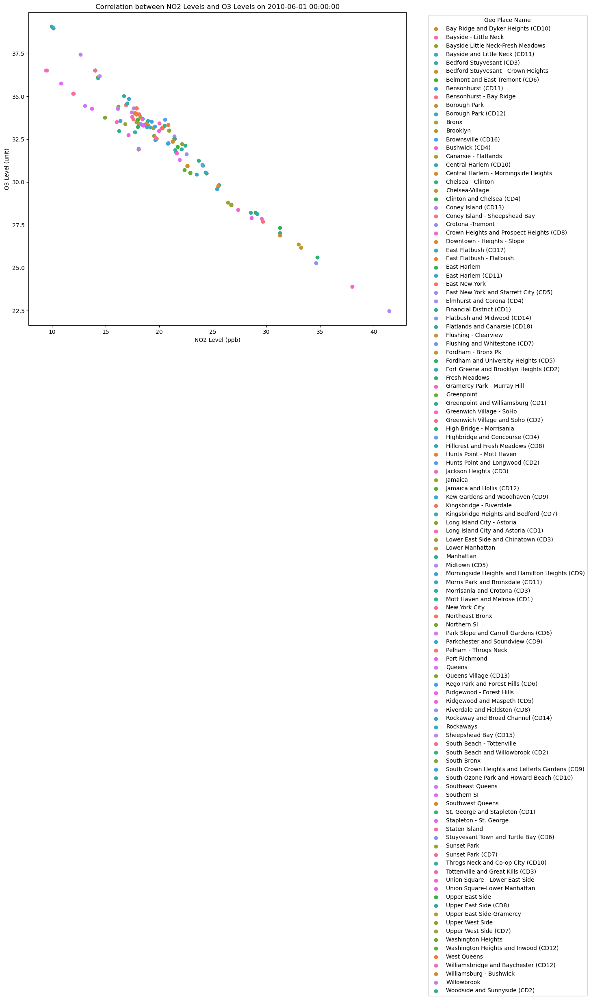

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


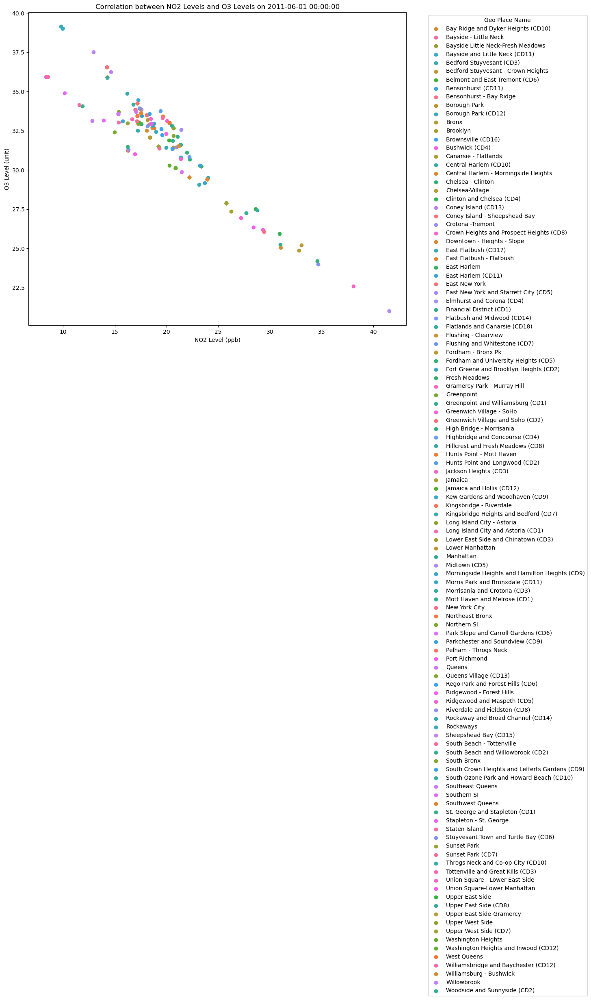

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


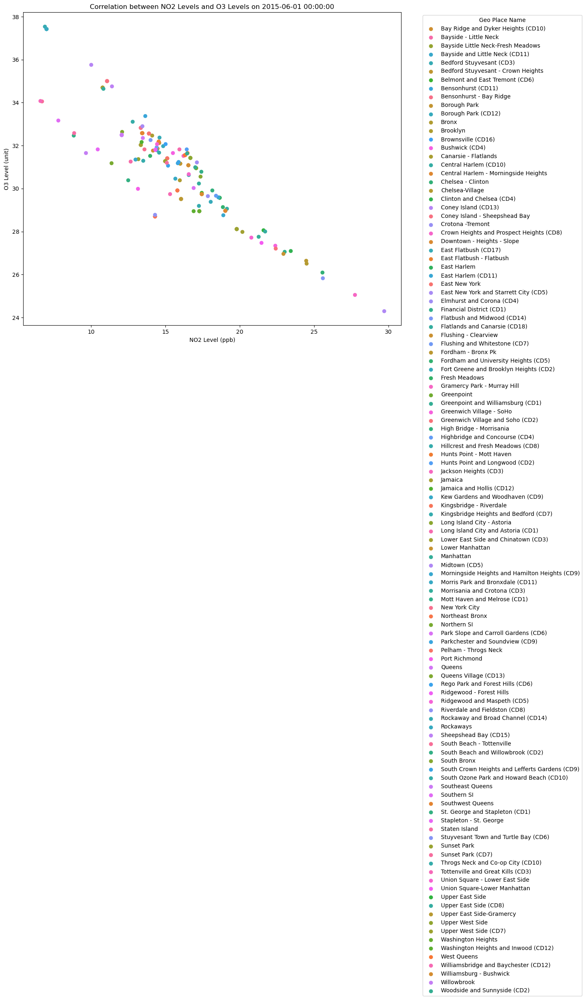

/var/folders/fy/4kwzbshx6671r7wl5z9y1v9c0000gn/T/ipykernel_61082/3971924760.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


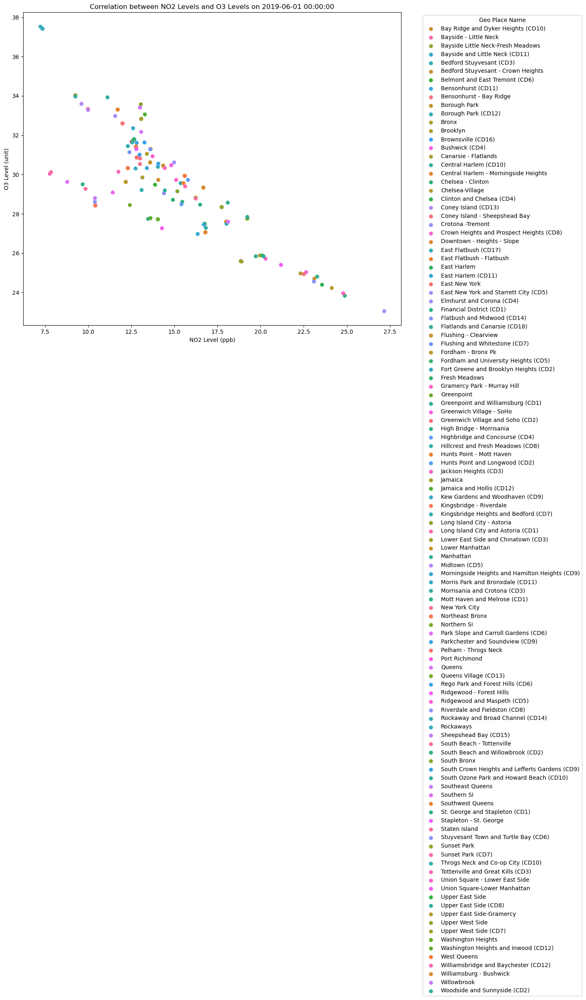

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Name', 'Data Value', 'Geo Place Name', and 'Start_Date' are columns in your cleaned DataFrame

# Step 1: Filter for NO2 and O3 observations
no2_data = df2[df2['Name'] == 'Nitrogen dioxide (NO2)'][['Geo Place Name', 'Start_Date', 'Data Value']].rename(columns={'Data Value': 'NO2 Level'})
o3_data = df2[df2['Name'] == 'Ozone (O3)'][['Geo Place Name', 'Start_Date', 'Data Value']].rename(columns={'Data Value': 'O3 Level'})

# Step 2: Merge on 'Geo Place Name' and 'Start_Date' to align observations
comparison_data = pd.merge(no2_data, o3_data, on=['Geo Place Name', 'Start_Date'], how='inner')

# Step 3: Group by 'Start_Date' and plot scatter plots without legend for each start date
colors = sns.color_palette('husl', len(comparison_data['Geo Place Name'].unique()))
name_color_mapping = {name: colors[i] for i, name in enumerate(comparison_data['Geo Place Name'].unique())}

unique_start_dates = comparison_data['Start_Date'].unique()

for start_date in unique_start_dates:
    plt.figure(figsize=(12, 10))

    start_date_data = comparison_data[comparison_data['Start_Date'] == start_date]

    for name, data in start_date_data.groupby('Geo Place Name'):
        color = name_color_mapping[name]
        plt.scatter(data['NO2 Level'], data['O3 Level'], label=name, color=color)

    plt.title(f'Correlation between NO2 Levels and O3 Levels on {start_date}')
    plt.xlabel('NO2 Level (ppb)')
    plt.ylabel('O3 Level (unit)')
    plt.legend(title='Geo Place Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


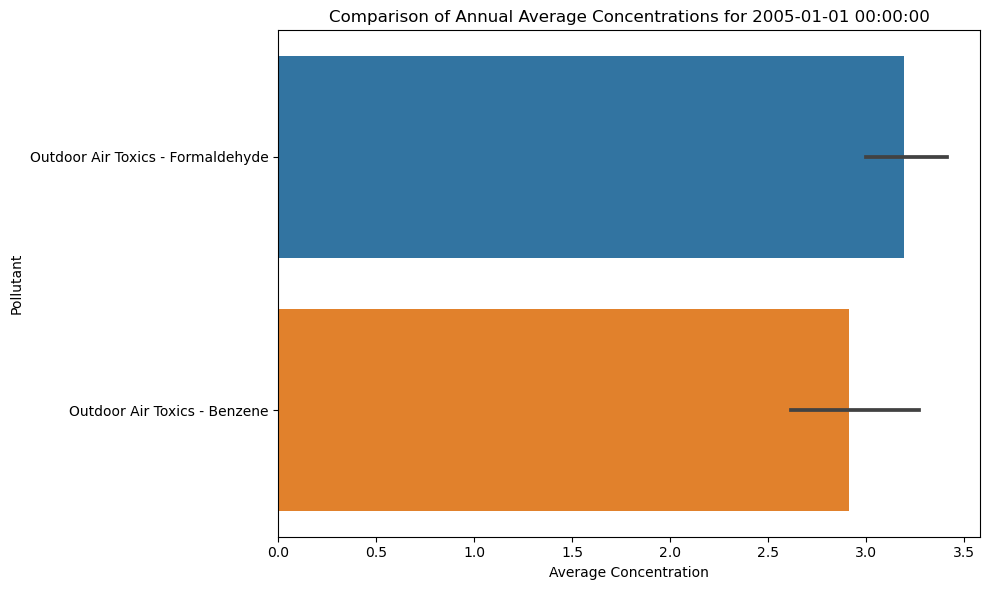

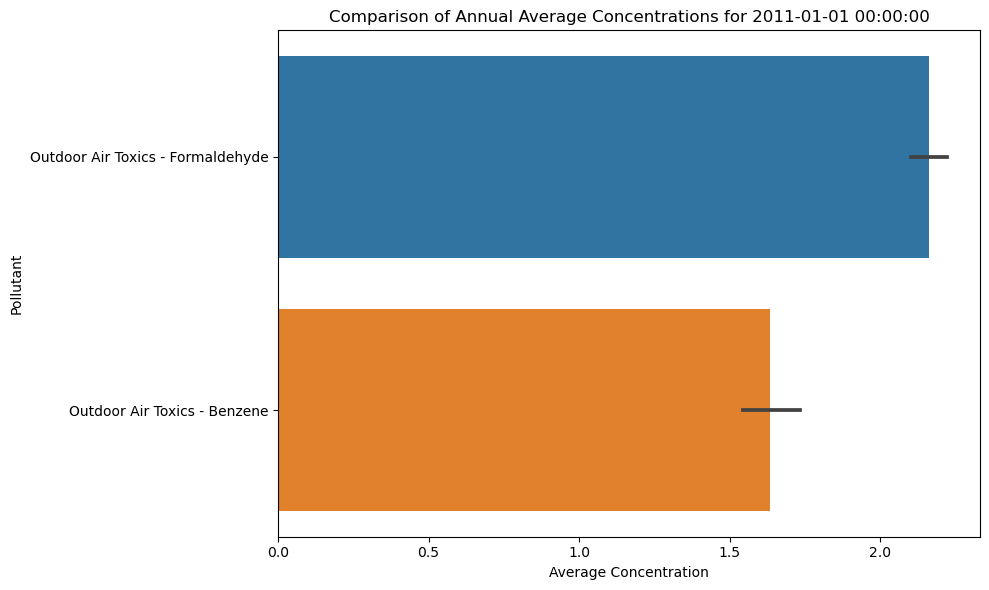

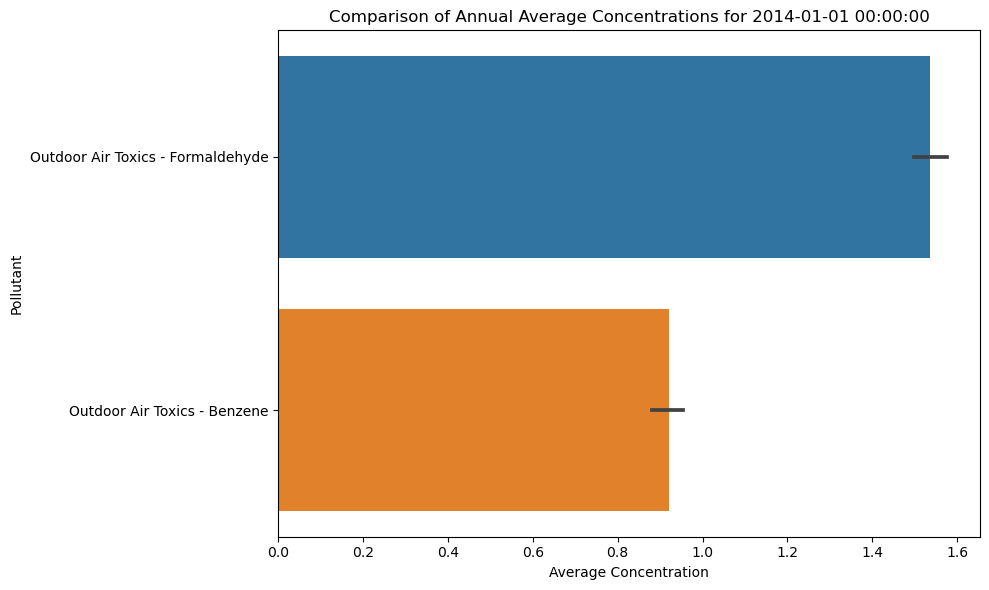

In [132]:

# Get data for annual average concentrations
annual_avg_concentrations = df[df['Measure'] == 'Annual average concentration']

# Group by 'Start_Date' and plot a separate plot for each
unique_start_dates = annual_avg_concentrations['Start_Date'].unique()

for start_date in unique_start_dates:
    plt.figure(figsize=(10, 6))
    data_for_date = annual_avg_concentrations[annual_avg_concentrations['Start_Date'] == start_date]
    sns.barplot(x='Data Value', y='Name', data=data_for_date, estimator=np.mean)
    plt.title(f'Comparison of Annual Average Concentrations for {start_date}')
    plt.xlabel('Average Concentration')
    plt.ylabel('Pollutant')
    plt.tight_layout()
    plt.savefig(f'comparison_annual_avg_concentrations_{start_date}.png')  # Save each plot with a unique filename
    plt.show()
